# DATASCI 207: Applied Machine Learning - Final Project
## <span style="color:blue"> Scott Abramson, Brett Brandom, Maria Jose Healey, Yidai Yao </span>

### <span style="color:chocolate"> Pawpularity:Predicting Engagement with a Pet's Profile Based on the Photograph for that Profile.  </span>

#### ``Introduction``

Have you ever wondered how much a captivating picture can influence your decision to adopt or facilitate the adoption of an animal? In the world of the animal welfare, where countless of stray animals are suffering on the streets or in shelters every day, the power of a single image extends beyond aesthetics – it serves as a potential lifeline.
PetFinder.my is Malaysia’s leading animal welfare platform and it collaborates closely with animal lovers, media, corporations, and global organizations to improve animal welfare. Currently it analyzes cuteness and other factors to rank animals images, which is still in an experimental stage with rooms for improvements.

#### ``Objective``

With the rise of data science, we aim to help by predicting the appealingness of an image through the "Pawpularity" project to hopefully increase the chances of finding caring homes for these rescue animals. By analyzing both raw images and the metadata, we seek to enhance PetFinder.my's existing approach and provide actionable insights to increase adoption rates. Through this endeavor, we strive to not only improve the fortunes of individual animals but also contribute to the broader cause of animal welfare worldwide.

#### ``Data``

The data was obtained from kaggle: https://www.kaggle.com/competitions/petfinder-pawpularity-score

The dataset comprises both images and tabular data (hand-labeled metadata for each photo). 
The Pawpularity Score is derived from each pet profile's page view statistics at the listing pages, using an algorithm that normalizes the traffic data across different pages, platforms (web & mobile) and various metrics.

The training Data is composed of a train folder and a csv file. The train folder contains training set photos of the form {id}.jpg, where {id} is a unique Pet Profile ID. Whereas, the train.csv contains the metadata for each photo in the training set as well as the target, the photo's Pawpularity score. The Id column gives the photo's unique Pet Profile ID corresponding the photo's file name.

Each photo in the metadata is labeled with the value of 1 (Yes) or 0 (No) for each of the following features: 

- Focus - Pet stands out against uncluttered background, not too close / far.

- Eyes - Both eyes are facing front or near-front, with at least 1 eye / pupil decently clear.

- Face - Decently clear face, facing front or near-front.

- Near - Single pet taking up significant portion of photo (roughly over 50% of photo width or height).

- Action - Pet in the middle of an action (e.g., jumping).

- Accessory - Accompanying physical or digital accessory / prop (i.e. toy, digital sticker), excluding collar and leash.

- Group - More than 1 pet in the photo.

- Collage - Digitally-retouched photo (i.e. with digital photo frame, combination of multiple photos).

- Human - Human in the photo.

- Occlusion - Specific undesirable objects blocking part of the pet (i.e. human, cage or fence). Note that not all blocking objects are considered occlusion.

- Info - Custom-added text or labels (i.e. pet name, description).

- Blur - Noticeably out of focus or noisy, especially for the pet’s eyes and face. For Blur entries, “Eyes” column is always set to 0.

### Step 1: Import libraries

In [240]:

import numpy as np
import pandas as pd
import random

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import keras

import sklearn
from sklearn.model_selection import train_test_split
# baseline classifier
from sklearn.dummy import DummyRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
# random forest
from sklearn.ensemble import RandomForestRegressor

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

import warnings
warnings.filterwarnings("ignore", category=UserWarning) #used to supress the tf version warning. 

import os 
import cv2
import glob
    
%matplotlib inline


In [2]:
path = 'C:\\Users\\maggi\\OneDrive\\Desktop\\DataSci-207\\Final Project\\'

### Step 2: Read Data

In [72]:
# Load images' paths
train_images = os.listdir(path + 'train')
train_df = pd.read_csv(path + 'train.csv')

train_df = train_df.set_index('Id')
file_names = []
labels = []
for index in train_df.index:
    file_name = path + 'train\\' + index + '.jpg'
    label = train_df.loc[index]['Pawpularity']
    file_names.append(file_name)
    labels.append(label/1.0)

# print number of images
print("Number of images: ", len(file_names))

Number of images:  9912


In [74]:
# tabular data
train_df = train_df.reset_index()
train_df

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
0,0007de18844b0dbbb5e1f607da0606e0,0,1,1,1,0,0,1,0,0,0,0,0,63
1,0009c66b9439883ba2750fb825e1d7db,0,1,1,0,0,0,0,0,0,0,0,0,42
2,0013fd999caf9a3efe1352ca1b0d937e,0,1,1,1,0,0,0,0,1,1,0,0,28
3,0018df346ac9c1d8413cfcc888ca8246,0,1,1,1,0,0,0,0,0,0,0,0,15
4,001dc955e10590d3ca4673f034feeef2,0,0,0,1,0,0,1,0,0,0,0,0,72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9907,ffbfa0383c34dc513c95560d6e1fdb57,0,0,0,1,0,0,0,0,0,0,0,1,15
9908,ffcc8532d76436fc79e50eb2e5238e45,0,1,1,1,0,0,0,0,0,0,0,0,70
9909,ffdf2e8673a1da6fb80342fa3b119a20,0,1,1,1,0,0,0,0,1,1,0,0,20
9910,fff19e2ce11718548fa1c5d039a5192a,0,1,1,1,0,0,0,0,1,0,0,0,20


### Step 3: EDA

#### Images

Display images in their original shape dimensions

In [238]:
# load images
images = []
for i in range (len(file_names)):
    img= load_img(file_names[i]) # loads an image from the specified file
    images.append(img)

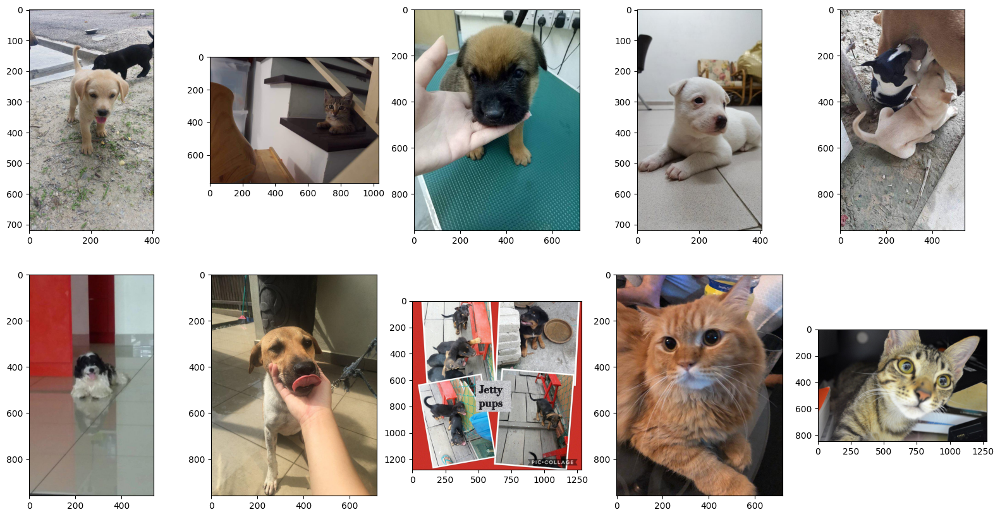

In [239]:
# Display 10 images in their original shape
index=0
num_rows=2
num_cols=5
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20,10))
for i in range(num_rows):
    for j in range(num_cols):
        axs[i,j].imshow(images[index])
        index+=1
plt.show()

In [7]:
# Checking first 20 images' shape dimensions
for i in range( len(images) ):
    n_shape= np.array(images[i])
    print(f"{i}" + " Image shape ", n_shape.shape)
    if i == 20:
        break

0 Image shape  (720, 405, 3)
1 Image shape  (774, 1032, 3)
2 Image shape  (960, 720, 3)
3 Image shape  (720, 405, 3)
4 Image shape  (960, 540, 3)
5 Image shape  (960, 540, 3)
6 Image shape  (960, 720, 3)
7 Image shape  (1280, 1280, 3)
8 Image shape  (960, 720, 3)
9 Image shape  (847, 1279, 3)
10 Image shape  (1280, 1280, 3)
11 Image shape  (720, 405, 3)
12 Image shape  (960, 540, 3)
13 Image shape  (960, 720, 3)
14 Image shape  (638, 581, 3)
15 Image shape  (960, 720, 3)
16 Image shape  (960, 1280, 3)
17 Image shape  (647, 648, 3)
18 Image shape  (960, 528, 3)
19 Image shape  (960, 720, 3)
20 Image shape  (569, 538, 3)


#### Identify Duplicate Images
Finding out duplicate images using imagehash (based on https://www.kaggle.com/code/schulta/petfinder-identify-duplicates-and-share-findings )

#### <span style="color:red">"DO NOT RUN" Start  </span>
The next 7 code cells require to import torch. This causes version incompatibilities with TensorFlow so, they need to run in a separate environment.

In [5]:
%load_ext autoreload
%autoreload 2

from PIL import Image
import torch # causes incompatibilities with TensorFlow
import imagehash


In [6]:
# Calculate hash values of every image in train
def hash_values():

    functions = [
        imagehash.average_hash, # average hashing
        imagehash.phash, # perceptual hashing
        imagehash.dhash, # difference hashing
        imagehash.whash, # wavelet hashing
    ]

    pet_ids = []
    hash_vals = []
    for img_path in glob.glob(path + 'train\\*.jpg'):
        image = Image.open(img_path)
        image_id = img_path.split('/')[-1].split('.')[0]
        pet_ids.append(image_id)
        hash_vals.append(np.array([func(image).hash for func in functions]).reshape(256))

    return pet_ids, np.array(hash_vals)

%time petids, hashes_all = hash_values()

CPU times: total: 2min 55s
Wall time: 5min 2s


In [7]:
# converts the numpy arrays of boolean values to tensors of int values
hashes_all = torch.Tensor(hashes_all.astype(int)).cuda()

Calculate similarity (normalized to 0-1 range) between all image pairs.

In [8]:
%time similarities = np.array([(hashes_all[i] == hashes_all).sum(dim=1).cpu().numpy()/256 for i in range(hashes_all.shape[0])])

CPU times: total: 5.19 s
Wall time: 5.65 s


Define a function to display and retrieve the pairs with in a given threshold range of similarity.

In [9]:
def show_dup_pairs(lower_threshold=0.0, upper_threshold=1.0, max=100,similarities = similarities):
    indices1 = np.where((similarities > lower_threshold) & (similarities <= upper_threshold))
    indices2 = np.where(indices1[0] != indices1[1])
    duplicates = {tuple(sorted([petids[index1], petids[index2]])): similarities[index1, index2] 
                for index1, index2 in zip(indices1[0][indices2], indices1[1][indices2])}
    print('Found %d duplicate pairs' % len(duplicates))
    
    count = 1
    for (path1, path2), similarities in duplicates.items():
        path_image1 = path1 + '.jpg'
        path_image2 = path2 + '.jpg'

        Id1 = path1.rsplit('\\', 1)[-1]
        Id2 = path2.rsplit('\\', 1)[-1]
        
        image1 = cv2.imread(path_image1)
        image2 = cv2.imread(path_image2)

        fig, axes = plt.subplots(nrows=1, ncols=2)
        fig.set_size_inches(12, 6)
        axes[0].title.set_text(Id1)
        axes[0].imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
        axes[1].title.set_text(Id2)
        axes[1].imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
        fig.suptitle(f'Similarity: {similarities}')
        plt.show()
        
        if count >= max:
            break
        
        count += 1
    
    return duplicates

Display images with similarity 0.9 - 1

Found 27 duplicate pairs


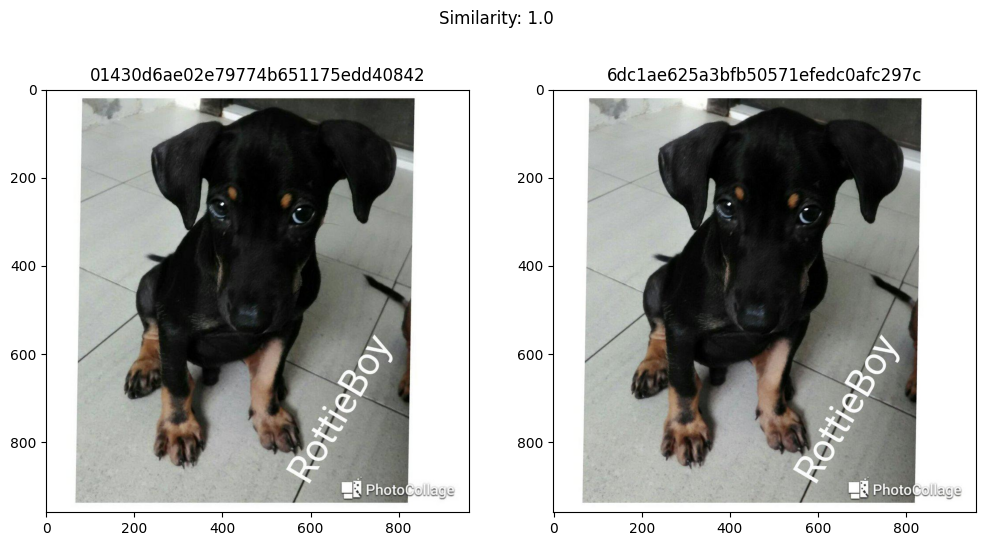

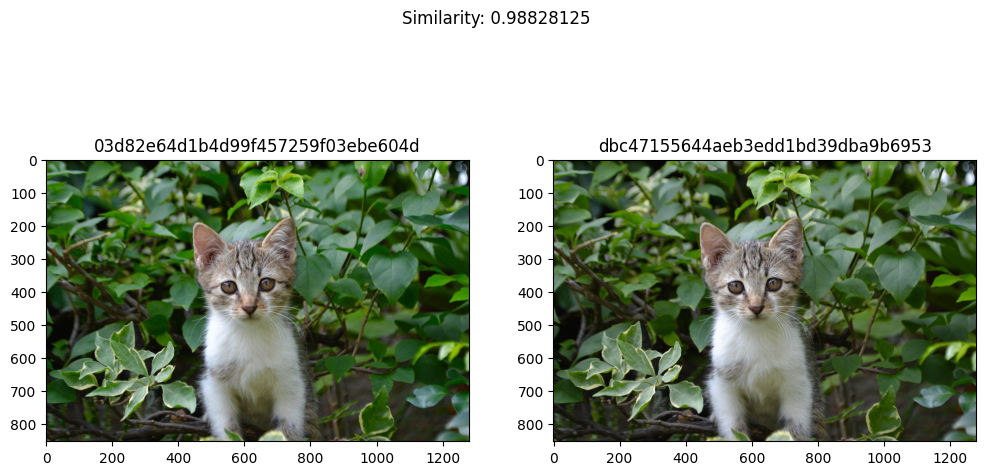

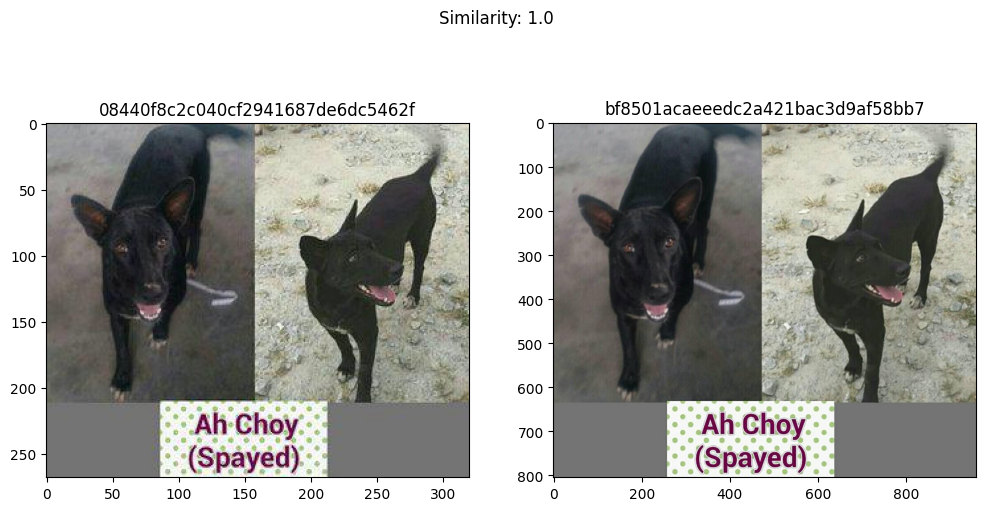

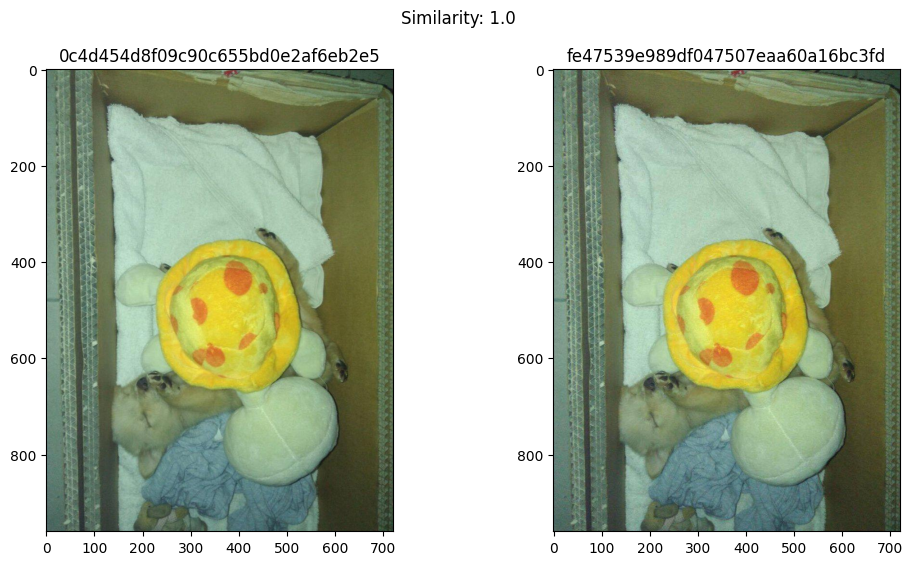

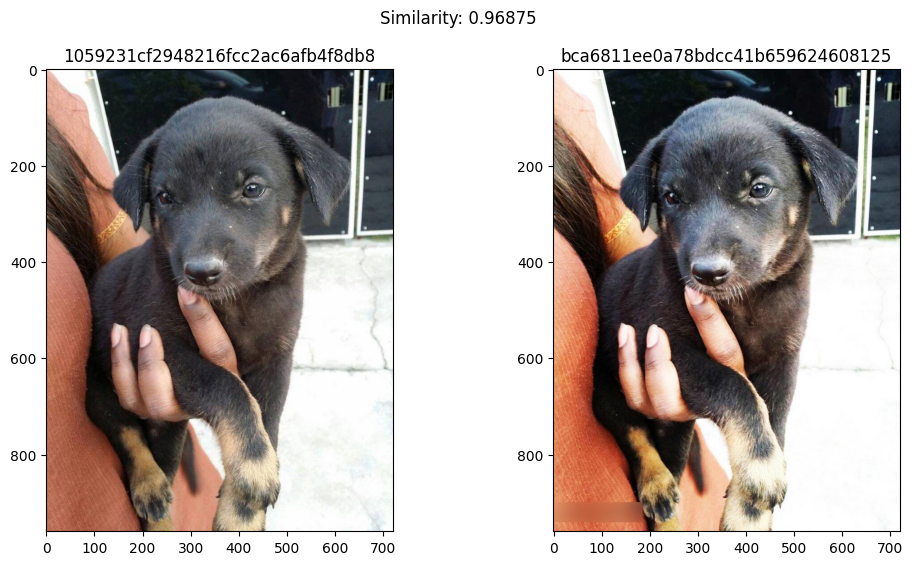

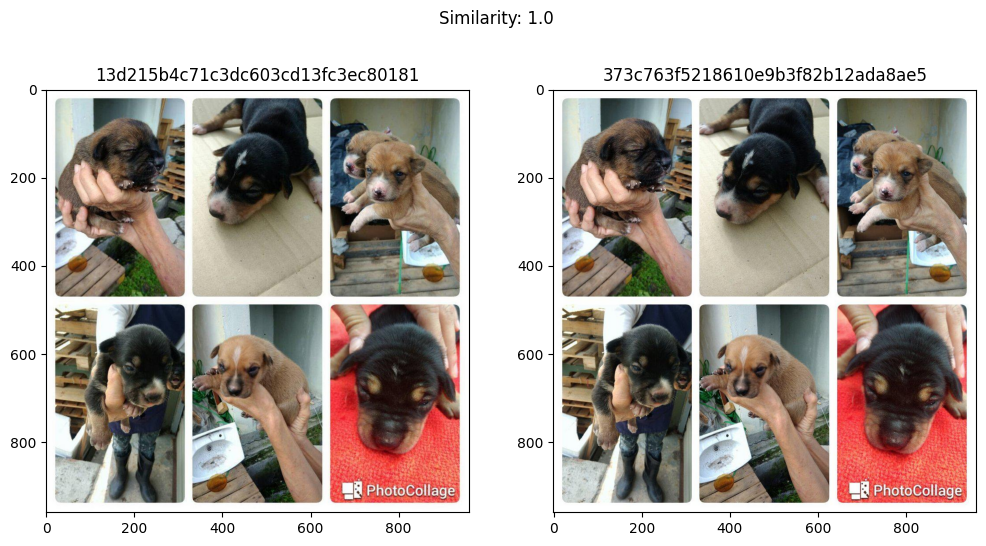

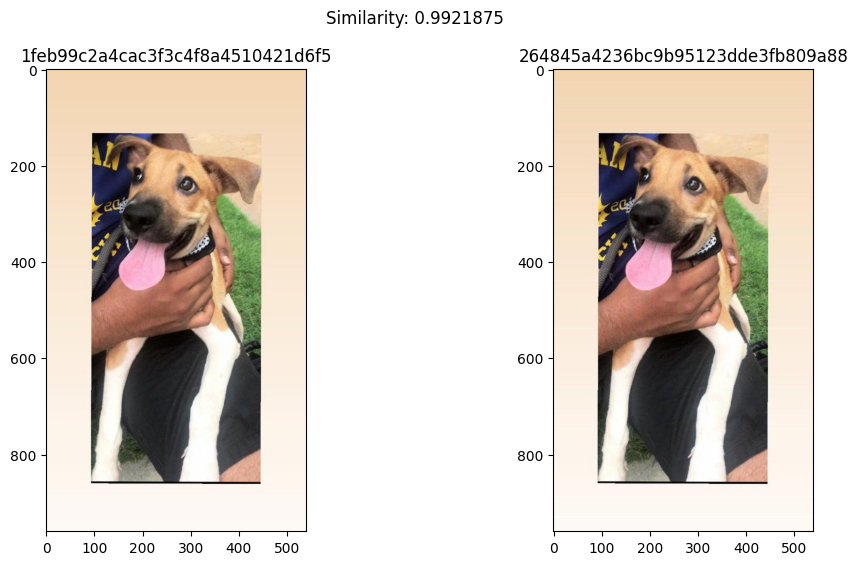

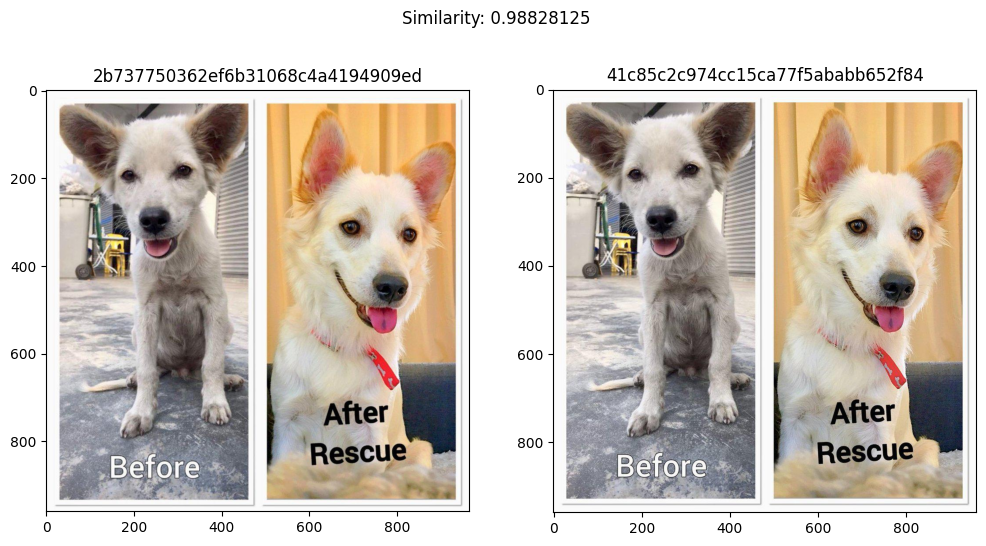

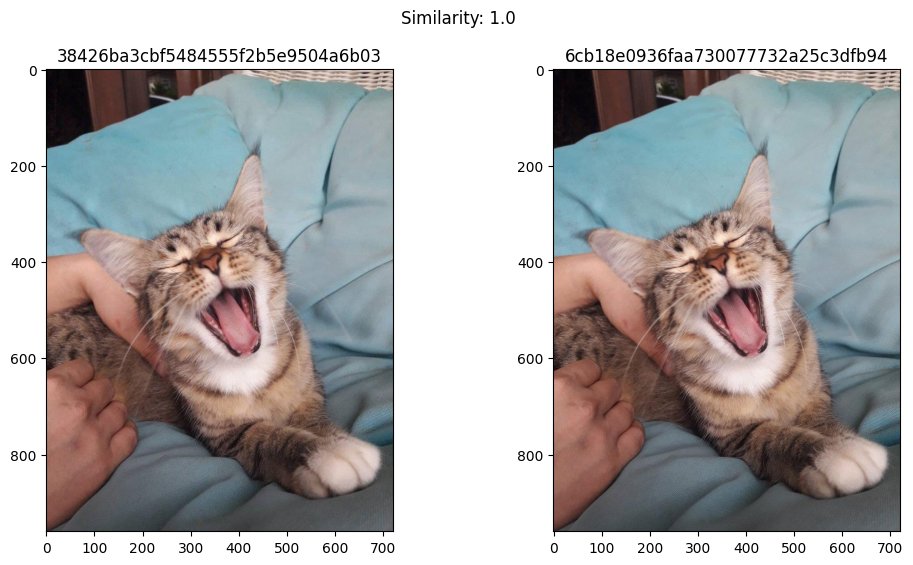

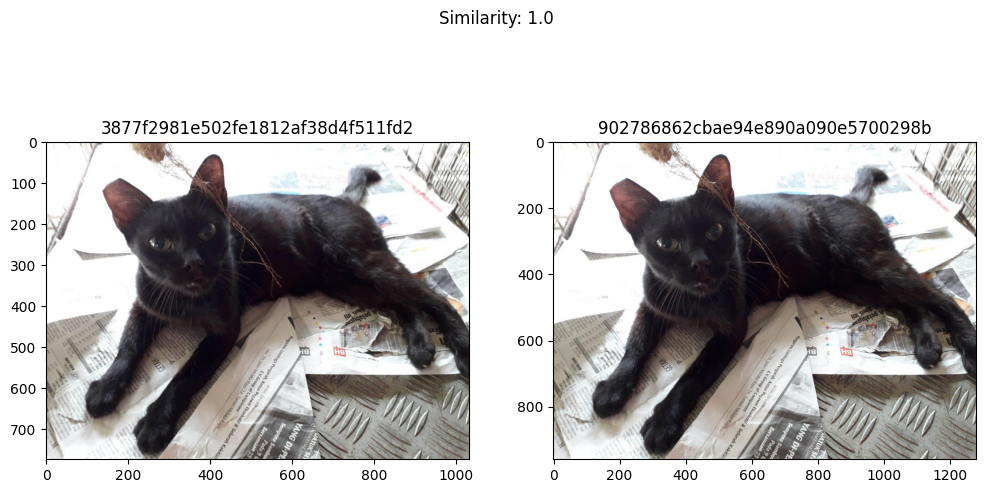

In [10]:
duplicate_images = show_dup_pairs(0.9, 1.0, 10)

In [11]:
# List of duplicate Ids 
paths_to_images2 = np.array(list(duplicate_images.keys()))[:, 1]
duplicate_ids2=[]
for i in range(len(paths_to_images2)):
    id2=paths_to_images2[i].rsplit('\\', 1)[-1] 
    duplicate_ids2.append(id2)
duplicate_ids2

['6dc1ae625a3bfb50571efedc0afc297c',
 'dbc47155644aeb3edd1bd39dba9b6953',
 'bf8501acaeeedc2a421bac3d9af58bb7',
 'fe47539e989df047507eaa60a16bc3fd',
 'bca6811ee0a78bdcc41b659624608125',
 '373c763f5218610e9b3f82b12ada8ae5',
 '264845a4236bc9b95123dde3fb809a88',
 '41c85c2c974cc15ca77f5ababb652f84',
 '6cb18e0936faa730077732a25c3dfb94',
 '902786862cbae94e890a090e5700298b',
 '9a0238499efb15551f06ad583a6fa951',
 '6ae42b731c00756ddd291fa615c822a1',
 'b956edfd0677dd6d95de6cb29a85db9c',
 'dd042410dc7f02e648162d7764b50900',
 'c504568822c53675a4f425c8e5800a36',
 '8ffde3ae7ab3726cff7ca28697687a42',
 '67e97de8ec7ddcda59a58b027263cdcc',
 '9b3267c1652691240d78b7b3d072baf3',
 '763d66b9cf01069602a968e573feb334',
 'c25384f6d93ca6b802925da84dfa453e',
 'b49ad3aac4296376d7520445a27726de',
 '988b31dd48a1bc867dbc9e14d21b05f6',
 'd050e78384bd8b20e7291b3efedf6a5b',
 'b967656eb7e648a524ca4ffbbc172c06',
 'b86589c3e85f784a5278e377b726a4d4',
 'e09a818b7534422fb4c688f12566e38f',
 'e359704524fa26d6a3dcd8bfeeaedd2e']

#### <span style="color:red">"DO NOT RUN" End  </span>

#### Create a new dataset that excludes duplicates

Create a new dataset that excludes duplicates with similarities greater than 0.9

In [8]:
# Create list of duplicate Ids
dup_ids = ['6dc1ae625a3bfb50571efedc0afc297c','dbc47155644aeb3edd1bd39dba9b6953','bf8501acaeeedc2a421bac3d9af58bb7','fe47539e989df047507eaa60a16bc3fd',
           'bca6811ee0a78bdcc41b659624608125', '373c763f5218610e9b3f82b12ada8ae5', '264845a4236bc9b95123dde3fb809a88', '41c85c2c974cc15ca77f5ababb652f84',
           '6cb18e0936faa730077732a25c3dfb94', '902786862cbae94e890a090e5700298b', '9a0238499efb15551f06ad583a6fa951','6ae42b731c00756ddd291fa615c822a1',
           'b956edfd0677dd6d95de6cb29a85db9c', 'dd042410dc7f02e648162d7764b50900', 'c504568822c53675a4f425c8e5800a36', '8ffde3ae7ab3726cff7ca28697687a42',
           '67e97de8ec7ddcda59a58b027263cdcc', '9b3267c1652691240d78b7b3d072baf3', '763d66b9cf01069602a968e573feb334', 'c25384f6d93ca6b802925da84dfa453e',
           'b49ad3aac4296376d7520445a27726de', '988b31dd48a1bc867dbc9e14d21b05f6', 'd050e78384bd8b20e7291b3efedf6a5b', 'b967656eb7e648a524ca4ffbbc172c06',
           'b86589c3e85f784a5278e377b726a4d4', 'e09a818b7534422fb4c688f12566e38f', 'e359704524fa26d6a3dcd8bfeeaedd2e']


In [75]:
# Dropping duplicates from train_df
for j in range(len(dup_ids)):
    train_df = train_df[train_df['Id'].str.contains(dup_ids[j]) == False]

train_df

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
0,0007de18844b0dbbb5e1f607da0606e0,0,1,1,1,0,0,1,0,0,0,0,0,63
1,0009c66b9439883ba2750fb825e1d7db,0,1,1,0,0,0,0,0,0,0,0,0,42
2,0013fd999caf9a3efe1352ca1b0d937e,0,1,1,1,0,0,0,0,1,1,0,0,28
3,0018df346ac9c1d8413cfcc888ca8246,0,1,1,1,0,0,0,0,0,0,0,0,15
4,001dc955e10590d3ca4673f034feeef2,0,0,0,1,0,0,1,0,0,0,0,0,72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9907,ffbfa0383c34dc513c95560d6e1fdb57,0,0,0,1,0,0,0,0,0,0,0,1,15
9908,ffcc8532d76436fc79e50eb2e5238e45,0,1,1,1,0,0,0,0,0,0,0,0,70
9909,ffdf2e8673a1da6fb80342fa3b119a20,0,1,1,1,0,0,0,0,1,1,0,0,20
9910,fff19e2ce11718548fa1c5d039a5192a,0,1,1,1,0,0,0,0,1,0,0,0,20


In [10]:
# Dropping duplicates from list of file name paths
new_file_names = []
for i in range(len(file_names)):
    img_id = file_names[i].rsplit('\\', 1)[-1].split('.')[0]
    if img_id not in dup_ids:
        new_file_names.append(file_names[i])

print(len(new_file_names))
print(new_file_names[0])

9885
C:\Users\maggi\OneDrive\Desktop\DataSci-207\Final Project\train\0007de18844b0dbbb5e1f607da0606e0.jpg


#### Tabular Data

In [11]:
# Checking for missing values in tabular data
print(train_df.isnull().sum())

Id               0
Subject Focus    0
Eyes             0
Face             0
Near             0
Action           0
Accessory        0
Group            0
Collage          0
Human            0
Occlusion        0
Info             0
Blur             0
Pawpularity      0
dtype: int64


In [12]:
# Checking for duplicates in tabular data
ids = train_df['Id']
train_df[ids.isin(ids[ids.duplicated()])].sort_values('Id')

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity


In [76]:
# Correlation of 'pawpularity' against all other features
train_df = train_df.set_index('Id')
corr_matrix = train_df.corr()['Pawpularity']
corr_matrix

Subject Focus   -0.010749
Eyes            -0.007127
Face             0.007870
Near             0.001399
Action          -0.001135
Accessory        0.014695
Group            0.016236
Collage          0.000995
Human            0.003922
Occlusion        0.001958
Info            -0.004317
Blur            -0.023713
Pawpularity      1.000000
Name: Pawpularity, dtype: float64

Text(0.5, 1.0, 'Train Correlation Heatmap')

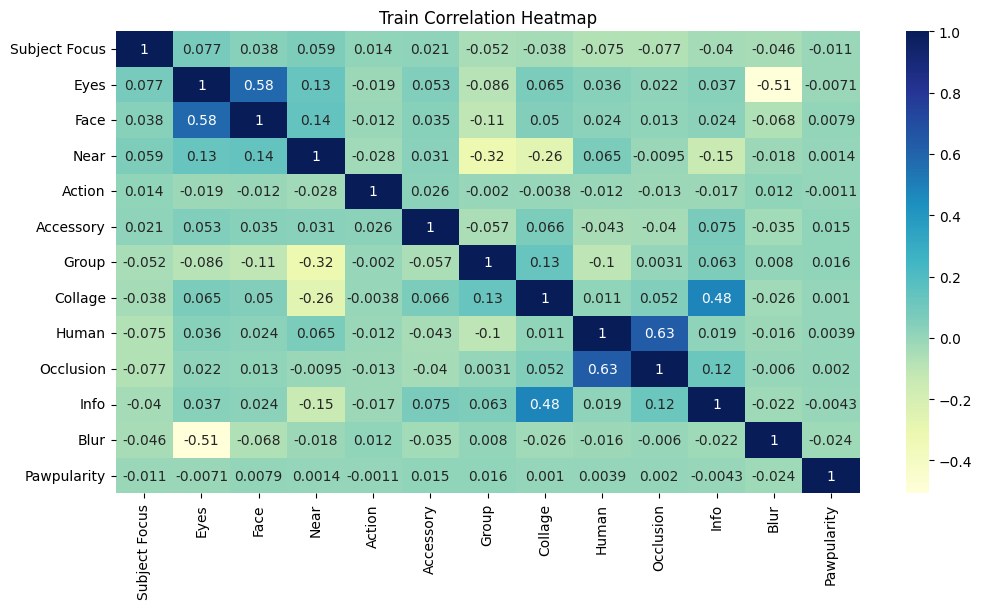

In [14]:
# Plot correlation heatmap
plt.figure(figsize=(12, 6))
heatmap = sns.heatmap(train_df.iloc[:].corr(), annot=True, cmap='YlGnBu')
heatmap.set_title('Train Correlation Heatmap')

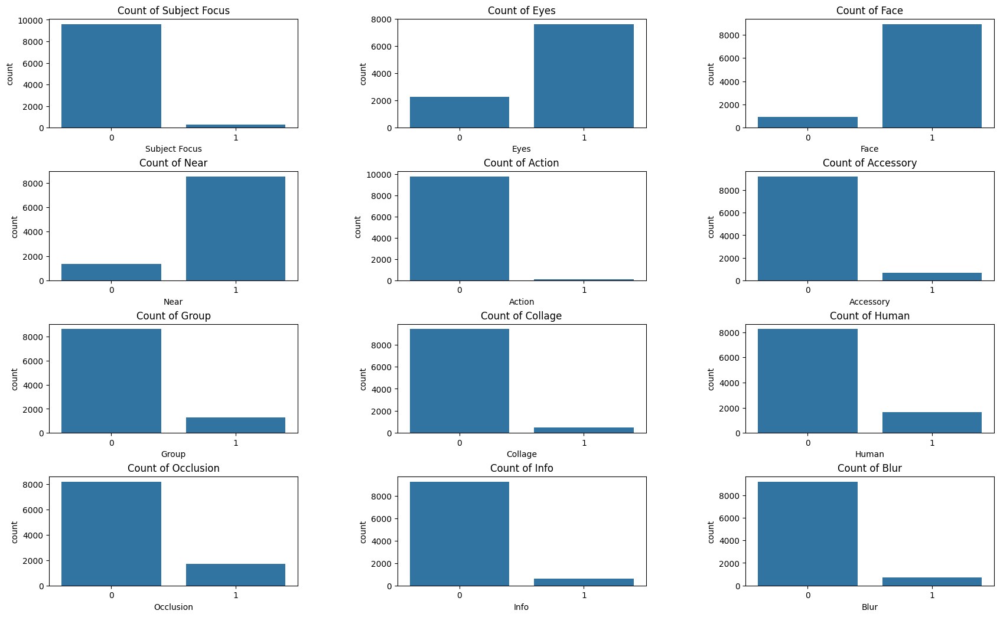

In [15]:
# Plot the count of every feature
columns= train_df.columns
i=0
j=0
k=0
fig, axs = plt.subplots(4, 3, figsize=(20,12))
for col in columns: 
    if (k < len(columns)-1) and (i!= 4):
        sns.countplot(data = train_df, x = col,ax = axs[i,j])
        axs[i,j].set_title(f'Count of {columns[k]}')
        if j==2:
            i+=1
            j=0
        else:
            j+=1
        k+=1
# set the spacing between subplots
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
plt.show()


In [16]:
# Statistics summary
train_df.describe()

,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
count,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000,9885.000000
mean,0.027618,0.772281,0.903794,0.861507,0.009914,0.067678,0.129287,0.049064,0.165908,0.171472,0.060799,0.070612,38.049975
std,0.163883,0.419381,0.294889,0.345434,0.099079,0.251206,0.335534,0.216013,0.372017,0.376940,0.238974,0.256189,20.599055
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,25.000000
50%,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,33.000000
75%,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,46.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,100.000000


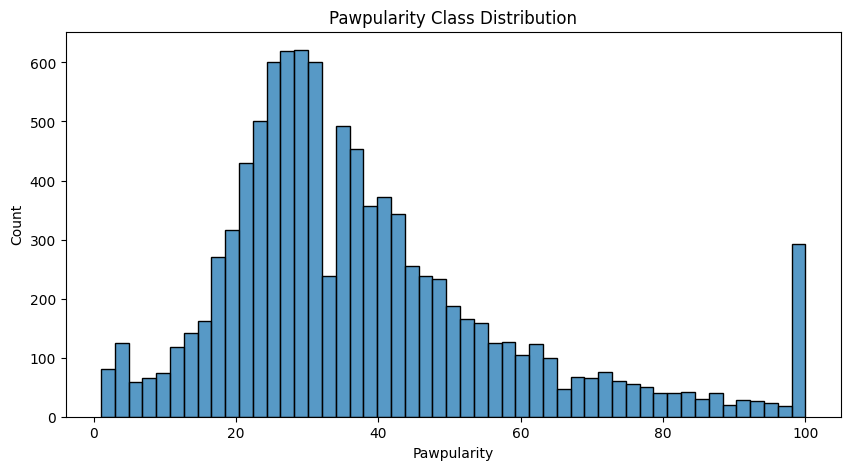

In [17]:
# Plot the target class distribution

# convert the labels array to a pandas dataframe
labels_df = pd.DataFrame(train_df['Pawpularity'], columns =['Pawpularity'])
# histogram
plt.figure(figsize=(10,5))
sns.histplot(data= labels_df, stat= 'count', x='Pawpularity')
plt.title('Pawpularity Class Distribution')
plt.xlabel("Pawpularity");

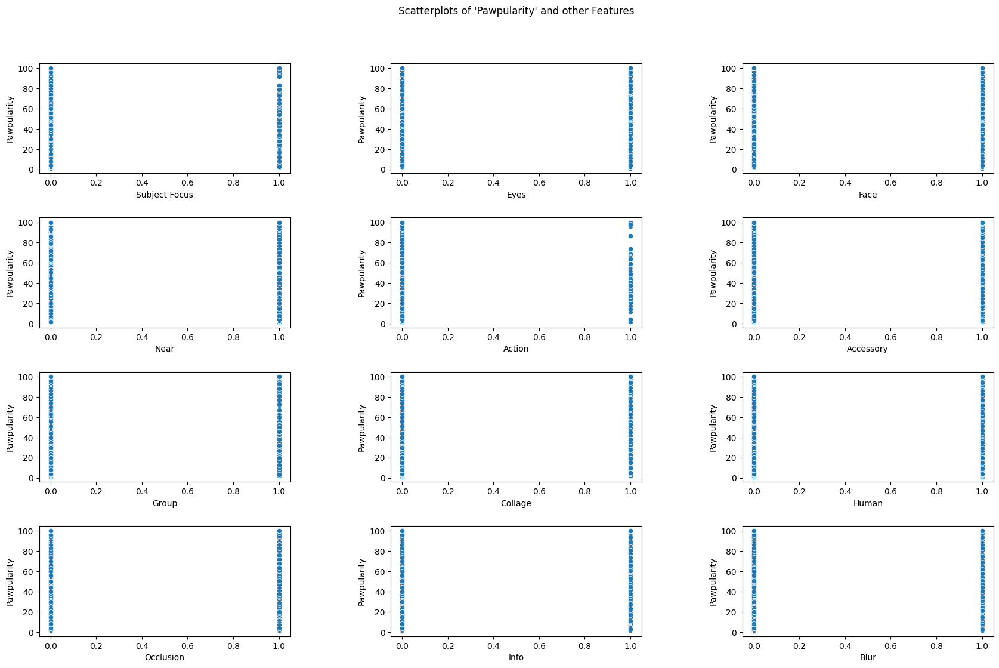

In [18]:
# Scatterplots of 'Pawpularity' and other features
columns= train_df.columns
i=0
j=0
k=0
fig, axs = plt.subplots(4, 3, figsize=(20,12))
for col in columns: 
    if (k < len(columns)-1) and (i!= 4):
        sns.scatterplot(data = train_df, x = col,y= 'Pawpularity',ax = axs[i,j])
        if j==2:
            i+=1
            j=0
        else:
            j+=1
        k+=1
# set the spacing between subplots
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
fig.suptitle('Scatterplots of \'Pawpularity\' and other Features')
plt.show()


### Step 4: Preprocess Data

In [200]:
# Data augmentation Class - includes class variables we can access throughout
class CF :
    resize_flag = True
    image_size = [224, 224]
    brightness_flag = False
    bright = 0.5
    contrast_flag = False
    contrast = [0.5, 1.5]
    hue_flag = False
    hue = 0.1
    sat_flag = False
    sat = [0.5, 1.5]
    flip_lr_flag = False
    flip_ud_flag = False
    zoom_flag = False
    zoom = [0.5, 0.25]
    def __repr__(self):
        config_string = "\n resize_flag : " + str(self.resize_flag) + ", image_size : " + ' '.join(str(size) for size in self.image_size)
        config_string += "\n brightness_flag : " + str(self.brightness_flag) + ", max_delta : " + str(self.bright)
        config_string += "\n contrast_flag : " + str(self.contrast_flag) +", min / max : " + ' '.join(str(c) for c in self.contrast)
        config_string += "\n hue_flag : " + str(self.hue_flag) + ", max_delta : " + str(self.hue)
        config_string += "\n sat_flag : " + str(self.sat) + ", min / max : " + ' '.join(str(s) for s in self.sat)
        config_string += "\n flip_lr_flag : " + str(self.flip_lr_flag)
        config_string += "\n flip_ud_flag : " + str(self.flip_ud_flag)
        config_string += "\n zoom_flag : " + str(self.zoom_flag) +", min / max : " + ' '.join(str(z) for z in self.zoom)

        return config_string

In [201]:
# train, validation, and test data
train_df = train_df.reset_index()
labels = list(train_df['Pawpularity']/1.0)
train_files, test_files, labels_train, labels_test = train_test_split(new_file_names, labels, test_size=0.2, random_state=137)
train_files, val_files, labels_train, labels_val = train_test_split(train_files, labels_train, test_size=0.2, random_state=137)

In [203]:
# Function to perform data transformation and augmentation
def process_file_names(file_name, label):
    image_string = tf.io.read_file(file_name)
    img = tf.io.decode_jpeg(image_string, channels=3)
    
    # Image augmentation - Apply any true preprocessing feature
    if CF.resize_flag == True :        
        img = tf.image.resize(img, CF.image_size) 
    if CF.brightness_flag == True :
        img = tf.image.random_brightness(img, max_delta = CF.bright)
    if CF.contrast_flag == True :
        img = tf.image.random_contrast(img, CF.contrast[0], CF.contrast[1])
    if CF.hue_flag == True :
        img = tf.image.random_hue(img, max_delta = CF.hue)
    if CF.sat_flag == True :
        img = tf.image.random_saturation(img, CF.sat[0], CF.sat[1])        
    if CF.flip_lr_flag == True :
        img = tf.image.random_flip_left_right(img)
    if CF.flip_ud_flag == True :
        img = tf.image.random_flip_up_down(img)
     
    # rescale image by dividing each pixel by 255.0 
    img = img / 255.0
    
    # rescale labels so between 0 and 1
    label = label/100.01
    
    return img, label

In [204]:
# Print the current configuration modifications on the originals
print(CF().__repr__())


 resize_flag : True, image_size : 224 224
 brightness_flag : False, max_delta : 0.5
 contrast_flag : False, min / max : 0.5 1.5
 hue_flag : False, max_delta : 0.1
 sat_flag : [0.5, 1.5], min / max : 0.5 1.5
 flip_lr_flag : False
 flip_ud_flag : False
 zoom_flag : False, min / max : 0.5 0.25


In [205]:
# Processing  file names in the test and validation sets without data augmentation
test_dataset = tf.data.Dataset.from_tensor_slices((test_files, labels_test))
test_dataset = test_dataset.map(process_file_names)

val_dataset = tf.data.Dataset.from_tensor_slices((val_files, labels_val))
val_dataset = val_dataset.map(process_file_names)

In [206]:
# Turn on all flags for data augmentation
CF.brightness_flag = True
CF.contrast_flag = True
CF.hue_flag = True
CF.sat_flag = True
CF.flip_lr_flag = True
CF.flip_ud_flag = True

# Print the current configuration modifications on the originals
print(CF().__repr__())



 resize_flag : True, image_size : 224 224
 brightness_flag : True, max_delta : 0.5
 contrast_flag : True, min / max : 0.5 1.5
 hue_flag : True, max_delta : 0.1
 sat_flag : [0.5, 1.5], min / max : 0.5 1.5
 flip_lr_flag : True
 flip_ud_flag : True
 zoom_flag : False, min / max : 0.5 0.25


In [207]:
# processing file names in the train set with data augmentation
train_dataset = tf.data.Dataset.from_tensor_slices((train_files, labels_train))
train_dataset = train_dataset.map(process_file_names)

In [208]:
# Configuring performance
def configure_for_performance(ds):
    ds = ds.cache()
    ds = ds.shuffle(buffer_size=1000)
    ds = ds.batch(32)
    return ds
    
train_dataset = configure_for_performance(train_dataset)
val_dataset = configure_for_performance(val_dataset)
test_dataset = configure_for_performance(test_dataset)

In [209]:
# Show the modified images in the specified batch data set
def show_tfbatch_images(dataset) :
    
    for images, labels in dataset.take(1):  # only take first element of dataset
        numpy_images = images.numpy()
        numpy_labels = labels.numpy()

    nrows, ncols = 5,5 #print first 25 images
    f, axs = plt.subplots(nrows, ncols, figsize=(30,20))
    for i in range(nrows):
        for j in range(ncols):
            indx = i*ncols+j
            axs[i,j].imshow(array_to_img(numpy_images[indx]))
            axs[i,j].set(title=numpy_labels[indx])
    return

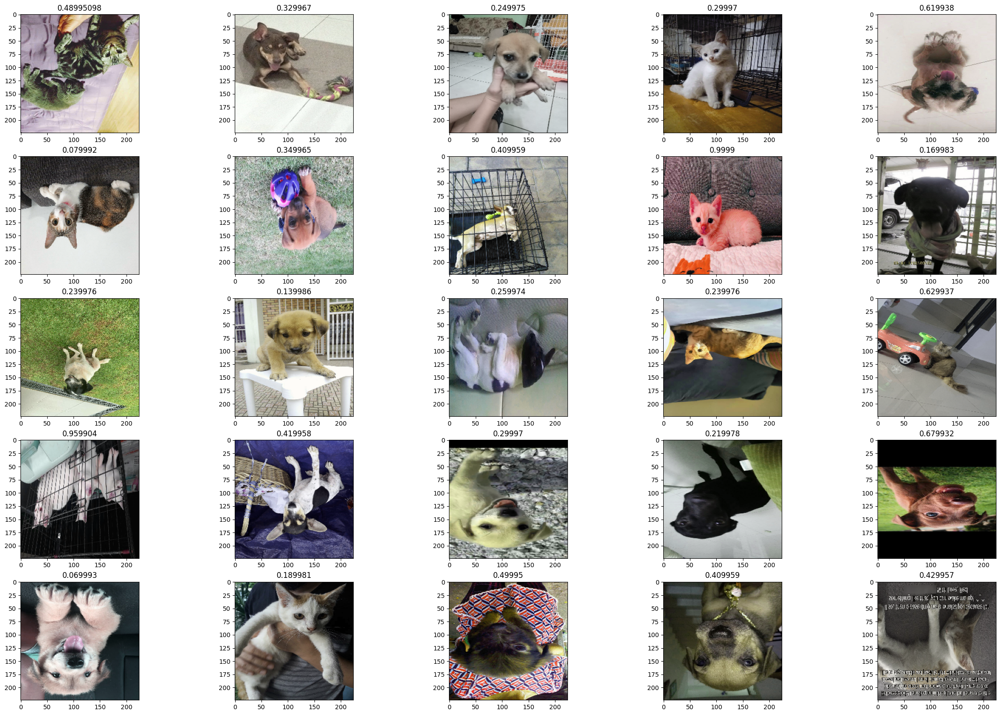

In [210]:
show_tfbatch_images(train_dataset)

### Step 5: Modeling and Evaluation

### <span style="color:chocolate"> Baseline Model  </span>

#### Dummy Model

Predict Mean Pawpularity Score

In [224]:
train_df = train_df.set_index('Id')
# Baseline: Mean Pawpularity Score
y = train_df['Pawpularity'].to_numpy()
X = train_df.drop(columns=['Pawpularity']).to_numpy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=137)

In [225]:
# Dummy model
dummy_model = DummyRegressor(strategy='mean')
dummy_model.fit(X_train, y_train)
y_pred = dummy_model.predict(X_test)
np.sqrt(mean_squared_error(y_pred, y_test))

20.42747312170261

In [226]:
# Cross validation score
dummy_model = DummyRegressor(strategy='mean')
scores = cross_val_score(dummy_model, X, y, cv=10, scoring='neg_root_mean_squared_error')
print("%0.2f RMSE with a standard deviation of %0.2f" % (-scores.mean(), scores.std()))

20.59 RMSE with a standard deviation of 0.52


### <span style="color:chocolate"> Random Forest  </span>

In [229]:
# Random Forest model - Metadata only
rf_regressor = RandomForestRegressor(n_estimators=100)
scores = cross_val_score(rf_regressor, X, y, cv=10, scoring='neg_root_mean_squared_error')
print("%0.2f RMSE with a standard deviation of %0.2f" % (-scores.mean(), scores.std()))

20.77 RMSE with a standard deviation of 0.56


No improvement over the dummy model!

### <span style="color:chocolate"> Improvement on Baseline Model  </span>

### ResNet

In [230]:
# Define residual layer

class ResidualUnit(tf.keras.layers.Layer):
    def __init__(self, filters, strides=1, activation='relu', **kwargs):
        super().__init__(**kwargs)
        self.activation = tf.keras.activations.get(activation)
        self.main_layers = [
            tf.keras.layers.Conv2D(filters, kernel_size=3, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False),
            tf.keras.layers.BatchNormalization(),
            self.activation,
            tf.keras.layers.Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False),
            tf.keras.layers.BatchNormalization()
        ]
        # If strides > 1 need to use 1D convolutions with long stride to resize image so they can be added
        if strides == 1:
            self.skip_layers = []
        else:
            self.skip_layers = [
                tf.keras.layers.Conv2D(filters, kernel_size=1, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False),
                tf.keras.layers.BatchNormalization()
            ]
    def call(self, inputs):
        z = inputs
        for layer in self.main_layers:
            z = layer(z)
        skip_z = inputs
        for layer in self.skip_layers:
            skip_z = layer(skip_z)
        # either return a(z) + skip_z or a(z + skip_z)
        return self.activation(z + skip_z)

In [231]:
# Define ResNet

def build_resnet():
    tf.keras.backend.clear_session()
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, kernel_size=7, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False, input_shape=[224,224,3]))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Activation('relu'))
    model.add(tf.keras.layers.MaxPooling2D(pool_size=3, strides=2, padding='same'))
    prev_filters = 128
    for filters in [64, 64, 128, 256, 512]:
        strides = 1 if filters == prev_filters else 2
        model.add(ResidualUnit(filters, strides=strides))
        prev_filters = filters


    model.add(tf.keras.layers.GlobalAvgPool2D())
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dropout(0.25))
    model.add(tf.keras.layers.Dense(units=1, activation="sigmoid"))
    model.compile(optimizer=tf.keras.optimizers.legacy.Adam(),
                  loss="binary_crossentropy",
                  metrics=[tf.keras.metrics.RootMeanSquaredError()])
    return model


In [232]:
# build model
resnet = build_resnet()

# use early stopping
early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)

# Train the model
history_rn = resnet.fit(train_dataset,
                  epochs=10,
                  validation_data=val_dataset,
                  verbose=1,
                  callbacks=[early_stopping_callback])

Epoch 1/10
198/198 [==============================] - 628s 3s/step - loss: 0.7227 - root_mean_squared_error: 0.2485 - val_loss: 0.6699 - val_root_mean_squared_error: 0.2105
Epoch 2/10
198/198 [==============================] - 757s 4s/step - loss: 0.6766 - root_mean_squared_error: 0.2187 - val_loss: 0.6708 - val_root_mean_squared_error: 0.2106
Epoch 3/10
198/198 [==============================] - 545s 3s/step - loss: 0.6717 - root_mean_squared_error: 0.2140 - val_loss: 0.7557 - val_root_mean_squared_error: 0.2631
Epoch 4/10
198/198 [==============================] - 428s 2s/step - loss: 0.6669 - root_mean_squared_error: 0.2092 - val_loss: 0.6710 - val_root_mean_squared_error: 0.2107
Epoch 5/10
198/198 [==============================] - 387s 2s/step - loss: 0.6635 - root_mean_squared_error: 0.2056 - val_loss: 0.6697 - val_root_mean_squared_error: 0.2093
Epoch 6/10
198/198 [==============================] - 385s 2s/step - loss: 0.6598 - root_mean_squared_error: 0.2013 - val_loss: 0.6831 

In [233]:
resnet.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 112, 112, 64)      9408      
                                                                 
 batch_normalization (BatchN  (None, 112, 112, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 112, 112, 64)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 56, 56, 64)       0         
 )                                                               
                                                                 
 residual_unit (ResidualUnit  (None, 28, 28, 64)       78592     
 )                                                               
                                                        

In [234]:
resnet_hist = pd.DataFrame(history_rn.history)
display(resnet_hist)

,loss,root_mean_squared_error,val_loss,val_root_mean_squared_error
0,0.722695,0.248466,0.669871,0.210455
1,0.676572,0.218675,0.670830,0.210606
2,0.671700,0.214037,0.755683,0.263130
3,0.666893,0.209191,0.670958,0.210661
4,0.663547,0.205581,0.669652,0.209320
5,0.659803,0.201309,0.683060,0.224550
6,0.654785,0.195211,0.690485,0.227332
7,0.649177,0.188227,0.687258,0.229179
8,0.638797,0.174910,0.686027,0.227246
9,0.627577,0.159717,0.689912,0.229156


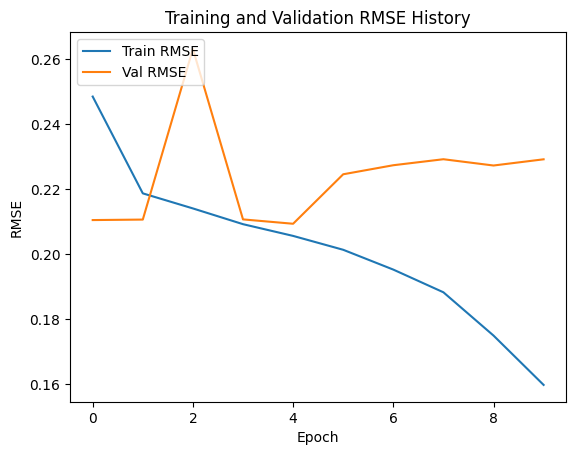

In [235]:
# Plot the training & validation RMSE

plt.rcdefaults() # reset to rc default values
plt.plot(resnet_hist['root_mean_squared_error'])
plt.plot(resnet_hist['val_root_mean_squared_error'])

plt.title("Training and Validation RMSE History")
plt.xlabel("Epoch")
plt.ylabel("RMSE")

plt.legend(["Train RMSE", "Val RMSE"], loc ="upper left")

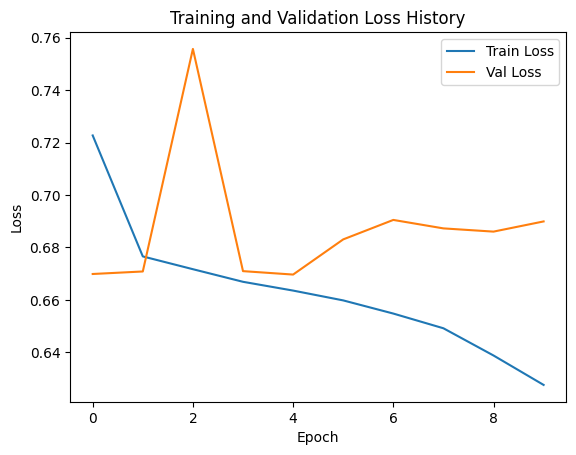

In [236]:
# Plot the training & validation loss

plt.plot(resnet_hist['loss'])
plt.plot(resnet_hist['val_loss'])

plt.title("Training and Validation Loss History")
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.legend(["Train Loss", "Val Loss"], loc ="upper right")

### ResNet Evaluation

In [237]:
# Pawpularity scores 
pawp_scores = resnet.evaluate(test_dataset, verbose = 1) 
print('Test loss:', pawp_scores[0]) 
print('Test RMSE:', pawp_scores[1])

62/62 [==============================] - 24s 377ms/step - loss: 0.6674 - root_mean_squared_error: 0.2082
Test loss: 0.6674004793167114
Test RMSE: 0.20821978151798248


### Step 6: Interpretation

TBD